# Импортируем все что требуется 

In [61]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns
import sys
from matplotlib import rcParams

# Style settings
rcParams['figure.figsize'] = 15,10
sns.set_theme(style="darkgrid")

# Переменные и словарь ICD-10 для удобства 

In [62]:
# VARS

PATH = '.\\data\\' if sys.platform == 'win32' else './data/'

In [63]:
ICD_10_chapter_description = {
    'I': 'Некоторые инфекционные и паразитарные болезни',
    'II':  'Новообразования',
    'III':  'Болезни крови, кроветворных органов и отдельные нарушения, вовлекающие иммунный механизм',
    'IV':  'Болезни эндокринной системы, расстройства питания и нарушения обмена веществ',
    'V':  'Психические расстройства и расстройства поведения',
    'VI':  'Болезни нервной системы',
    'VII':  'Болезни глаза и его придаточного аппарата',
    'VIII':  'Болезни уха и сосцевидного отростка',
    'IX':  'Болезни системы кровообращения',
    'X':  'Болезни органов дыхания',
    'XI':  'Болезни органов пищеварения',
    'XII':  'Болезни кожи и подкожной клетчатки',
    'XIII':  'Болезни костно-мышечной системы и соединительной ткани',
    'XIV':  'Болезни мочеполовой системы',
    'XV':  'Беременность, роды и послеродовой период',
    'XVI':  'Отдельные состояния, возникающие в перинатальном периоде',
    'XVII':  'Врожденные аномалии [пороки развития], деформации и хромосомные нарушения',
    'XVIII':  'Симптомы, признаки и отклонения от нормы, выявленные при клинических и лабораторных исследованиях, не классифицированные в других рубриках',
    'XIX':  'Травмы, отравления и некоторые другие последствия воздействия внешних причин',
    'XX':  'Внешние причины заболеваемости и смертности',
    'XXI':  'Факторы, влияющие на состояние здоровья населения и обращения в учреждения здравоохранения',
    'XXII':  'Коды для особых целей'
}

ICD_10_chapter = {
    'I': ['A00', 'B99'],
    'II': ['C00', 'D48'],
    'III': ['D50','D89'],
    'IV': ['E00','E90'],
    'V': ['F00','F99'],
    'VI': ['G00','G99'],
    'VII': ['H00','H59'],
    'VIII': ['H60','H95'],
    'IX': ['I00','I99'],
    'X': ['J00','J99'],
    'XI': ['K00','K93'],
    'XII': ['L00','L99'],
    'XIII': ['M00','M99'],
    'XIV': ['N00','N99'],
    'XV': ['O00','O99'],
    'XVI': ['P00','P96'],
    'XVII': ['Q00','Q99'],
    'XVIII': ['R00','R99'],
    'XIX': ['S00','T98'],
    'XX': ['V01','Y98'],
    'XXI': ['Z00','Z99'],
    'XXII': ['U00','U85']
}

In [64]:
def get_chapter(code):
    for cls, limits in ICD_10_chapter.items():
        if limits[0] <= code[:3] <= limits[1]:
            return cls
    return None

def get_description(chapter):
    return ICD_10_chapter_description[chapter]

# Exploratory Data Analisis

Посмотрим на данные на предмет исайдов, скрытых закономерностей итд

In [65]:
df = pd.read_csv(''.join([PATH, 'prepared_df.csv']), index_col=0)
orig_df = df.copy()

In [66]:
df.head(10)

,PATIENT_SEX,ADRES,MKB_CODE,CHAPTER,AGE_CATEGORY,MONTH,YEAR,DATE,IS_COVID,PATIENT_ID_COUNT,TARGET_RANGE
0,Female,Гурьевск,A00.0,I,18-44,8,2021,2021-08-01,True,1,1-10
1,Female,Калининград,A00.0,I,0-18,3,2020,2020-03-01,True,1,1-10
2,Female,Гусев,A00,I,0-18,3,2019,2019-03-01,False,1,1-10
3,Female,Калининград,A00,I,0-18,1,2022,2022-01-01,True,1,1-10
4,Female,Калининград,A00,I,0-18,2,2018,2018-02-01,False,1,1-10
5,Female,Калининград,A00,I,0-18,3,2022,2022-03-01,True,4,1-10
6,Female,Калининград,A00,I,60-74,3,2022,2022-03-01,True,1,1-10
7,Female,Калининград,A00,I,45-59,3,2022,2022-03-01,True,1,1-10
8,Female,Калининград,A00,I,18-44,3,2022,2022-03-01,True,3,1-10
9,Female,Калининград,A00,I,18-44,7,2018,2018-07-01,False,1,1-10


In [67]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2212393 entries, 0 to 2212392
Data columns (total 11 columns):
 #   Column            Dtype 
---  ------            ----- 
 0   PATIENT_SEX       object
 1   ADRES             object
 2   MKB_CODE          object
 3   CHAPTER           object
 4   AGE_CATEGORY      object
 5   MONTH             int64 
 6   YEAR              int64 
 7   DATE              object
 8   IS_COVID          bool  
 9   PATIENT_ID_COUNT  int64 
 10  TARGET_RANGE      object
dtypes: bool(1), int64(3), object(7)
memory usage: 187.8+ MB


In [68]:
df.shape

(2212393, 11)

## Целевая переменная (PATIENT_ID_COUNT)

Посмотрим на распределение целевой переменной. Как видно из описания, распределение не нормальное 

In [69]:
df.PATIENT_ID_COUNT.describe().apply(lambda x: format(x, 'f'))

count    2212393.000000
mean           5.847853
std           60.427796
min            1.000000
25%            1.000000
50%            1.000000
75%            2.000000
max        13532.000000
Name: PATIENT_ID_COUNT, dtype: object

По созданной заранее переменной посмотрим, как много примеров входят в определенные "размахи"

/tmp/ipykernel_5112/1254335668.py:3: UserWarning:

FixedFormatter should only be used together with FixedLocator



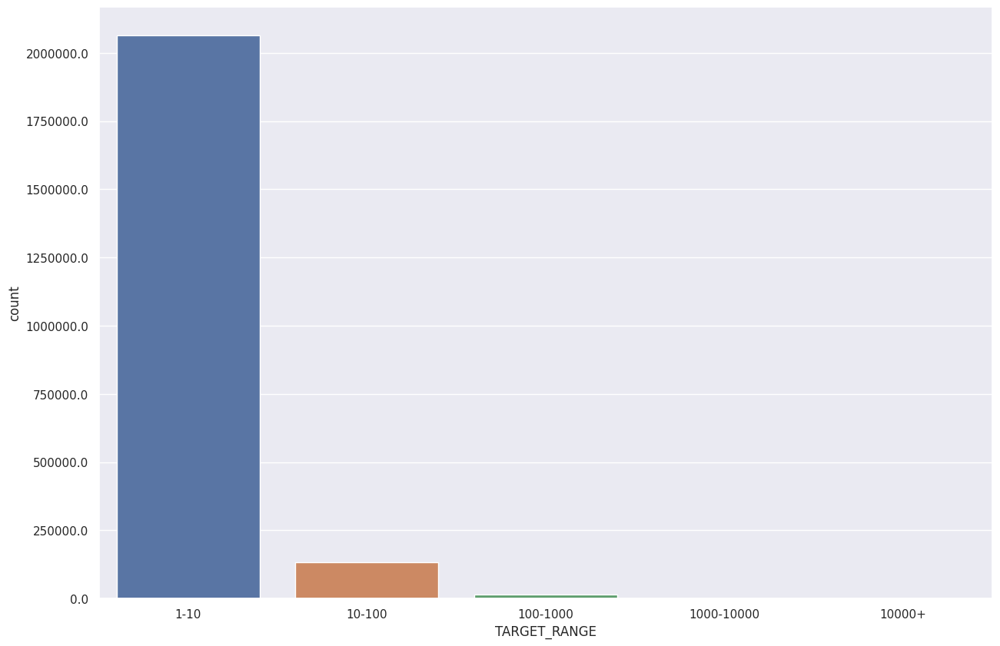

In [70]:
g = sns.countplot(data=df, x='TARGET_RANGE')
ylabels = ['{:}'.format(x) for x in g.get_yticks()]
g.set_yticklabels(ylabels);

In [71]:
pd.DataFrame({
    'value_counts' : df.TARGET_RANGE.value_counts(),
    'normalized' : df.TARGET_RANGE.value_counts(normalize=True) * 100
})

,value_counts,normalized
1-10,2064557,93.317824
10-100,133136,6.017737
100-1000,13791,0.623352
1000-10000,905,0.040906
10000+,4,0.000181


* 93,4% распределены в промежутке от 1 до 10 случаев 
* 6% распределены в промежутке от 10 до 100 случаев
* 0,06% распределены в промежутке от 100 до 1000 случаев 
* <0.05 % составляет оставшийся промежуток

В условиях подобного дисбаланса придется решать множества проблем обучения. 

Рассмотрим сколько уникальных значений входит в каждый промежуток

In [72]:
df.groupby('TARGET_RANGE').PATIENT_ID_COUNT.nunique()

TARGET_RANGE
1-10           10
10-100         90
100-1000      841
1000-10000    743
10000+          4
Name: PATIENT_ID_COUNT, dtype: int64

Первые три промежутка (Которые составляют в сумме порядка 99% всего датасета) содержат значения из почти всего диапазона. Для диапазонов от 1000 и выше ситуация другая: там содержится меньше уникальных значений, чем в сумме всех предыдущих

Посмотрим на распределение целевой переменной в первом промежутке

/tmp/ipykernel_5112/219366199.py:3: UserWarning:

FixedFormatter should only be used together with FixedLocator



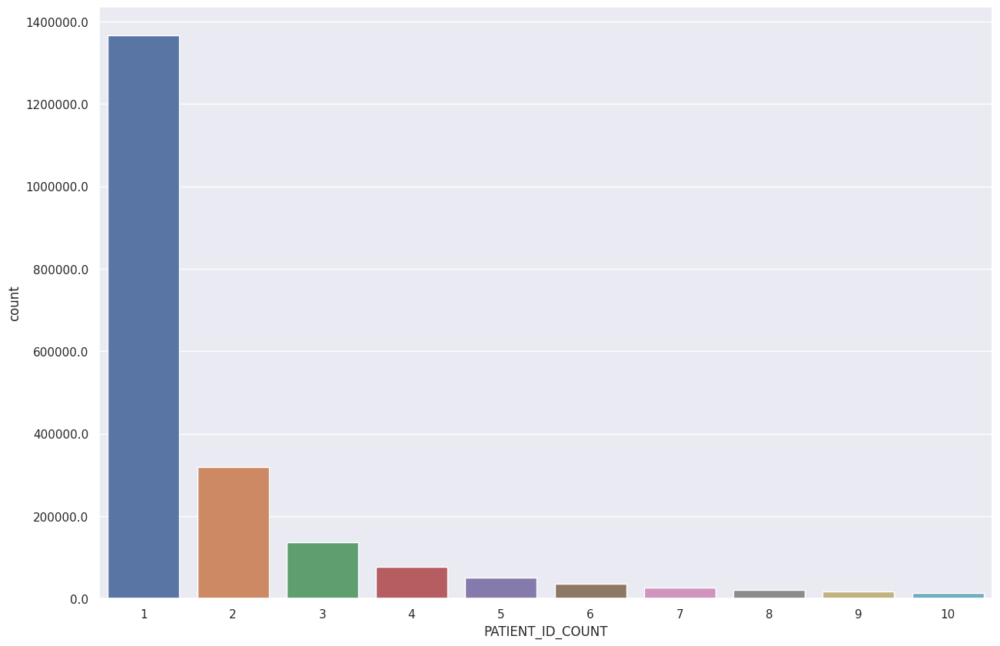

In [73]:
g = sns.countplot(data=df[df.TARGET_RANGE == '1-10'], x='PATIENT_ID_COUNT')
ylabels = ['{:}'.format(x) for x in g.get_yticks()]
g.set_yticklabels(ylabels);

In [74]:
pd.DataFrame({
    'value_counts' : df[df.TARGET_RANGE == '1-10'].PATIENT_ID_COUNT.value_counts(),
    'normalized' :df[df.TARGET_RANGE == '1-10'].PATIENT_ID_COUNT.value_counts(normalize=True) * 100
})

,value_counts,normalized
1,1366778,66.201999
2,318988,15.450675
3,136250,6.599479
4,77480,3.752863
5,50492,2.445658
6,36202,1.753500
7,26606,1.288703
8,21021,1.018185
9,16873,0.817270
10,13867,0.671670


Визуализация для прочих пределов будет слишком громоздкой, потому оставим только таблицы и посмотрим на 10 самых распространенных значений : 

In [75]:
pd.DataFrame({
    'value_counts' : df[df.TARGET_RANGE == '10-100'].PATIENT_ID_COUNT.value_counts(),
    'normalized' :df[df.TARGET_RANGE == '10-100'].PATIENT_ID_COUNT.value_counts(normalize=True) * 100
}).head(10)

,value_counts,normalized
11,11607,8.718153
12,9834,7.386432
13,8451,6.347645
14,7266,5.457577
15,6651,4.995644
16,5763,4.328656
17,5124,3.848696
18,4762,3.576794
19,4173,3.134389
20,3878,2.912811


In [76]:
pd.DataFrame({
    'value_counts' : df[df.TARGET_RANGE == '100-1000'].PATIENT_ID_COUNT.value_counts(),
    'normalized' :df[df.TARGET_RANGE == '100-1000'].PATIENT_ID_COUNT.value_counts(normalize=True) * 100
}).head(10)

,value_counts,normalized
105,167,1.210935
106,160,1.160177
104,158,1.145675
103,158,1.145675
107,155,1.123921
102,152,1.102168
101,150,1.087666
108,149,1.080415
114,145,1.051410
111,141,1.022406


In [77]:
pd.DataFrame({
    'value_counts' : df[df.TARGET_RANGE == '1000-10000'].PATIENT_ID_COUNT.value_counts(),
    'normalized' :df[df.TARGET_RANGE == '1000-10000'].PATIENT_ID_COUNT.value_counts(normalize=True) * 100
}).head(10)

,value_counts,normalized
1495,4,0.441989
1167,3,0.331492
1021,3,0.331492
1006,3,0.331492
1046,3,0.331492
1263,3,0.331492
1138,3,0.331492
1331,3,0.331492
1139,3,0.331492
1145,3,0.331492


In [78]:
pd.DataFrame({
    'value_counts' : df[df.TARGET_RANGE == '10000+'].PATIENT_ID_COUNT.value_counts(),
    'normalized' :df[df.TARGET_RANGE == '10000+'].PATIENT_ID_COUNT.value_counts(normalize=True) * 100
}).head(10)

,value_counts,normalized
13532,1,25.0
11667,1,25.0
10986,1,25.0
10092,1,25.0


Из данных видно, что для распределения 1-10 наиболее вероятно получить 1, 2 или 3, для распределения 10-100 - значение не выше 40-50, для прочих распределений - вероятность получить любое значение почти одинакова.

Посмотрим на топ-20 самых больших значений таргета. Так как после метода drop_duplicates() осталось 20 значений, то все они встречаются равно один раз. Это делает маловозможным перевод задачи регрессии в задачу классификации для экстремальных значений. 

In [79]:
df.PATIENT_ID_COUNT.nlargest(n=20).drop_duplicates()

1275524    13532
1275540    11667
1275584    10986
2194593    10092
2194541     9461
1275569     9332
1671175     9169
1275522     8901
2194580     8427
2194554     8234
1275581     8154
509872      8031
1670911     7397
1275538     7324
1275479     7175
509608      6973
1275600     6914
1275509     6887
2194609     6733
1275492     6679
Name: PATIENT_ID_COUNT, dtype: int64

## Рассмотрение прочих переменных и их распределения относительно целевой переменной

### PATIENT_SEX 

/tmp/ipykernel_5112/2042108451.py:3: UserWarning:

FixedFormatter should only be used together with FixedLocator



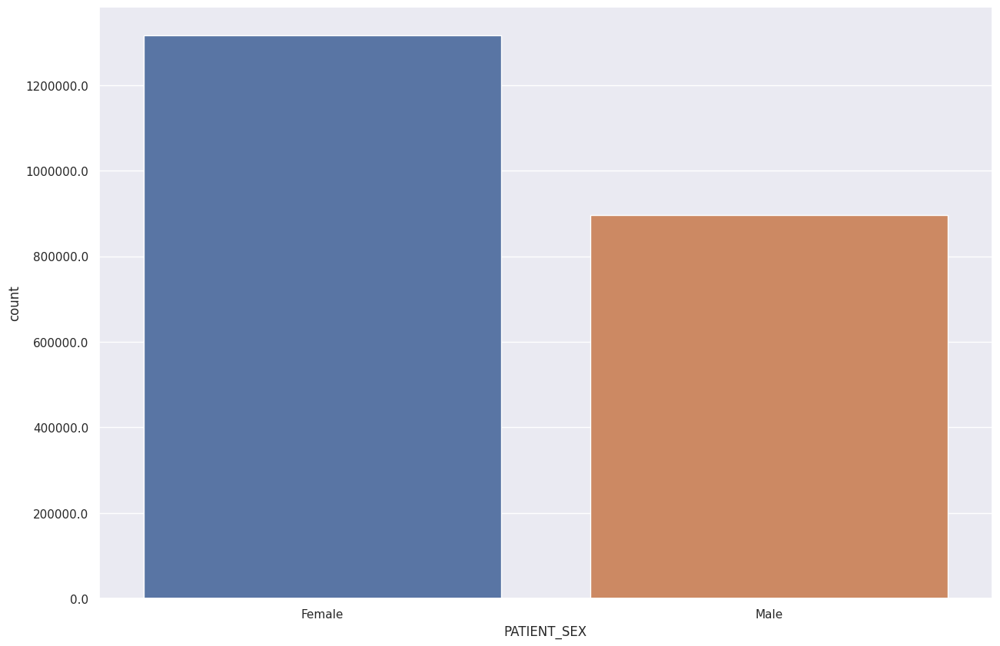

In [80]:
g = sns.countplot(data=df, x='PATIENT_SEX')
ylabels = ['{:}'.format(x) for x in g.get_yticks()]
g.set_yticklabels(ylabels);

In [81]:
pd.DataFrame({
    'value_counts' : df.groupby('TARGET_RANGE').PATIENT_SEX.value_counts(),
    'normalized' : df.groupby('TARGET_RANGE').PATIENT_SEX.value_counts(normalize=True) * 100
})

value_counts  normalized
TARGET_RANGE PATIENT_SEX                          
1-10         Female            1222862   59.231206
             Male               841695   40.768794
10-100       Female              84547   63.504236
             Male                48589   36.495764
100-1000     Female               8760   63.519687
             Male                 5031   36.480313
1000-10000   Female                537   59.337017
             Male                  368   40.662983
10000+       Female                  3   75.000000
             Male                    1   25.000000

В целом, процентное распределение полов в обоих группах совпадает, за исключением последней группы, что связано, скорее, с тем, что в данную группу попадает всего 4 наблюдения из всей выборки

### MKB_CODE

Потенциально одна из самых интересных колонок с точки зрения анализа. МКБ используется для преобразования словесной клинической формулировки диагнозов болезней и других проблем, связанных со здоровьем, в буквенноцифровые коды, которые обеспечивают удобство хранения, извлечения и анализа данных.

Посмотрим сколько всего уникальных кодов встречается в датасете

In [82]:
df.MKB_CODE.nunique()

7644

В исходном датасете были заранее созданы колонки соответствия для каждого кода - конкретной главе из МКБ. Посмотрим на распределение в этой колонке.

In [83]:
mkb_chapter_df = pd.DataFrame({
    'value_counts' : df.CHAPTER.value_counts(),
    'normalized' : df.CHAPTER.value_counts(normalize=True) * 100,
    'description' : [get_description(chapter) for chapter in df.CHAPTER.value_counts().index]
})

mkb_chapter_df

,value_counts,normalized,description
XXI,242834,10.976079,"Факторы, влияющие на состояние здоровья населе..."
XIII,224136,10.130931,Болезни костно-мышечной системы и соединительн...
XI,212697,9.613889,Болезни органов пищеварения
XIX,187850,8.490806,"Травмы, отравления и некоторые другие последст..."
X,187822,8.489541,Болезни органов дыхания
IX,183182,8.279813,Болезни системы кровообращения
II,164041,7.414641,Новообразования
XIV,156562,7.076591,Болезни мочеполовой системы
VII,119323,5.393391,Болезни глаза и его придаточного аппарата
XII,102152,4.617263,Болезни кожи и подкожной клетчатки


Посмотрим на то сколько уникальных кодов МКБ соответствует каждой главе в датасете

In [84]:
mkb_chapter_df['unique'] = [df.groupby('CHAPTER').MKB_CODE.nunique().loc[[index]].values[0] for index in mkb_chapter_df.index]

In [85]:
mkb_chapter_df

,value_counts,normalized,description,unique
XXI,242834,10.976079,"Факторы, влияющие на состояние здоровья населе...",522
XIII,224136,10.130931,Болезни костно-мышечной системы и соединительн...,482
XI,212697,9.613889,Болезни органов пищеварения,409
XIX,187850,8.490806,"Травмы, отравления и некоторые другие последст...",1084
X,187822,8.489541,Болезни органов дыхания,232
IX,183182,8.279813,Болезни системы кровообращения,350
II,164041,7.414641,Новообразования,721
XIV,156562,7.076591,Болезни мочеполовой системы,394
VII,119323,5.393391,Болезни глаза и его придаточного аппарата,233
XII,102152,4.617263,Болезни кожи и подкожной клетчатки,313


Таким образом наибольшее количество уникальных кодов соответствует главе XIX, а наименьшее главе VIII соответственно. 

Посмотрим какие главы встречаются в каждой группе целевой переменной

In [86]:
df.groupby('TARGET_RANGE').CHAPTER.unique()

TARGET_RANGE
1-10          [I, II, III, IV, V, VI, VII, VIII, IX, X, XI, ...
10-100        [I, II, III, IV, V, VI, VII, VIII, IX, X, XI, ...
100-1000      [I, II, IV, V, VI, VII, VIII, IX, X, XI, XII, ...
1000-10000                                 [IX, X, XI, XV, XXI]
10000+                                                    [XXI]
Name: CHAPTER, dtype: object

Посмотрим что это за главы, в которых возможны столь экстремальные значения

In [87]:
for i in df.groupby('TARGET_RANGE').CHAPTER.unique().loc[['1000-10000']].values[0]:
    print(f'{i}: {get_description(i)}')

IX: Болезни системы кровообращения
X: Болезни органов дыхания
XI: Болезни органов пищеварения
XV: Беременность, роды и послеродовой период
XXI: Факторы, влияющие на состояние здоровья населения и обращения в учреждения здравоохранения


Рассмотрим самые популярные главы для каждой категории

In [88]:
pd.DataFrame({
    'value_counts' : df.groupby('TARGET_RANGE').CHAPTER.value_counts(),
    'normalized' : df.groupby('TARGET_RANGE').CHAPTER.value_counts(normalize=True) * 100,
})

value_counts  normalized
TARGET_RANGE CHAPTER                          
1-10         XIII           210826   10.211682
             XXI            209389   10.142079
             XI             195531    9.470845
             XIX            179655    8.701867
             IX             170950    8.280227
...                            ...         ...
1000-10000   X                 275   30.386740
             IX                 62    6.850829
             XI                 40    4.419890
             XV                 14    1.546961
10000+       XXI                 4  100.000000

[67 rows x 2 columns]

Одна из самых популярных категорий - XXI, почти для каждой группы. Рассмотрим какие коды входят в эту группу 

In [89]:
pd.DataFrame({
    'value_counts' : df[df.CHAPTER == 'XXI'].MKB_CODE.value_counts(),
    'normalized' : df[df.CHAPTER == 'XXI'].MKB_CODE.value_counts(normalize=True) * 100,
})

,value_counts,normalized
Z00.0,15419,6.349605
Z02.7,13458,5.542058
Z01.2,11718,4.825519
Z01.4,8967,3.692646
Z00.8,8126,3.346319
...,...,...
Z51.2,1,0.000412
Z90.6,1,0.000412
Z89.1,1,0.000412
Z52.5,1,0.000412


522 уникальных кода. Самый распространенный встречается лишь в 6% случаях. При этом много кодов встречаются и вовсе только один раз. Посмотрим на эту главу и коды в привязке к целевой переменной

In [90]:
XXI_range_df = pd.DataFrame({
    'value_counts' : df[df.CHAPTER == 'XXI'].groupby('TARGET_RANGE').MKB_CODE.value_counts(),
    'normalized' : df[df.CHAPTER == 'XXI'].groupby('TARGET_RANGE').MKB_CODE.value_counts(normalize=True) * 100,
})

In [91]:
XXI_range_df.loc[['1-10']][:5]

value_counts  normalized
TARGET_RANGE MKB_CODE                          
1-10         Z00.0            12413    5.928201
             Z02.7            11006    5.256246
             Z01.2             9885    4.720878
             Z01.4             7201    3.439054
             Z00.8             6895    3.292914

In [92]:
XXI_range_df.loc[['10-100']][:5]

value_counts  normalized
TARGET_RANGE MKB_CODE                          
10-100       Z00.0             2412    8.556226
             Z02.7             1960    6.952820
             Z00.1             1773    6.289464
             Z01.4             1601    5.679319
             Z01.2             1527    5.416814

In [93]:
XXI_range_df.loc[['100-1000']][:5]

value_counts  normalized
TARGET_RANGE MKB_CODE                          
100-1000     Z25.8              906   19.126029
             Z00.0              491   10.365210
             Z02.7              443    9.351910
             Z01.2              281    5.932024
             Z00.1              227    4.792062

In [94]:
XXI_range_df.loc[['1000-10000']][:5]

value_counts  normalized
TARGET_RANGE MKB_CODE                          
1000-10000   Z11.5              109   21.206226
             Z00.0              103   20.038911
             Z25.8               87   16.926070
             Z00.1               86   16.731518
             Z02.7               49    9.533074

In [95]:
XXI_range_df.loc[['10000+']][:5]

,,value_counts,normalized
TARGET_RANGE,MKB_CODE,,
10000+,Z25.8,4,100.0


Исходя из представленных данных и МКБ-10 делаем выводы: 

1. Z00.0 - Ежегодный медосмотр
2. Z25.8 - Вакцинация от COVID. Большое значение обусловлено именно этим

In [96]:
df[df.MKB_CODE == 'Z25.8'].groupby('YEAR').PATIENT_ID_COUNT.describe()

,count,mean,std,min,25%,50%,75%,max
YEAR,,,,,,,,
2018,91.0,2.076923,2.256993,1.0,1.0,1.0,2.00,12.0
2019,138.0,2.652174,3.630069,1.0,1.0,1.0,2.00,25.0
2020,273.0,2.388278,2.183530,1.0,1.0,1.0,3.00,13.0
2021,2090.0,296.183732,994.339697,1.0,14.0,76.0,209.75,13532.0
2022,576.0,74.861111,211.404977,1.0,6.0,25.0,66.25,2179.0


Посмотрим на то как соотносятся коды МКБ и их средние значения. Рапсечатаем топ-15

In [97]:
df.groupby('MKB_CODE').PATIENT_ID_COUNT.mean().sort_values(ascending=False)[:15]

MKB_CODE
Z11.5    406.977528
Z25.8    209.391098
J06.9     48.156492
Z00.1     40.784657
Z00.0     39.690058
O99.8     26.306581
K02.1     24.135394
J00       23.526376
J02.9     22.177111
Z02.7     21.294249
I11.9     20.261081
Z00       19.599445
Z11.3     18.497296
Z36.8     18.146067
Z11.1     17.001460
Name: PATIENT_ID_COUNT, dtype: float64

Z11.5 - Скриннинговое исследование с целью выявления COVID. Среднее этого недавно-измененного кода сильно колерирует с годом: 

In [98]:
df[df.MKB_CODE == 'Z11.5'].groupby('YEAR').PATIENT_ID_COUNT.mean()

YEAR
2018      3.389474
2019      3.536000
2020    263.856557
2021    971.112195
2022    594.069767
Name: PATIENT_ID_COUNT, dtype: float64

# IS_COVID 

Посмотрим на то, как изменилась ситуация с приходом в нашу жизнь COVID-19. Потенциально это тоже может быть важным признаком для прогнозирования и анализа.

In [99]:
df[df.IS_COVID == True].TARGET_RANGE.value_counts()

1-10          826518
10-100         71114
100-1000        7845
1000-10000       580
10000+             4
Name: TARGET_RANGE, dtype: int64

In [100]:
df[df.IS_COVID == False].TARGET_RANGE.value_counts()

1-10          1238039
10-100          62022
100-1000         5946
1000-10000        325
Name: TARGET_RANGE, dtype: int64

Именно в процессе Covid-19 были зафиксированы экстремальные значения. Как мы помним из анализа кодов МКБ - мы связали это с проведением вакцинации.

In [101]:
df[df.IS_COVID == True].PATIENT_ID_COUNT.mean()

7.6851271603126055

In [102]:
df[df.IS_COVID == False].PATIENT_ID_COUNT.mean()

4.573535670870805

Среднее увеличилось почти в два раза, однако, без привязки к остальным признакам это не будет иметь смысла

# Подготовка датасета с удалением редких классов

Одна из возникших у меня гипотез заключается в том, что большое разнообразие некоторых категориальных переменных (в частности кодов МКБ) является негативным фактором для модели, которая начинает сильно переучиваться на такие примеры, в ситуации, когда разумнее в ответ на них давать медиану или моду таргета. Посмотрим на то сколько кодов МКБ встречаются один раз, сколько встречаются два раза и в каких пределах находится у них значение таргета

In [103]:
agg_func_math = ['sum', 'mean', 'median', 'min', 'max', 'std', 'var', 'mad', 'count']

mkb_info_df = df.groupby('MKB_CODE')['PATIENT_ID_COUNT'].agg(agg_func_math).round(2).sort_values(by='sum', ascending=False)

In [104]:
mkb_info_df[mkb_info_df['count'] == 1].index

Index(['P08.0', 'K13.3', 'P07', 'Q26.5', 'C25.4', 'A85', 'B54', 'Z57.7',
       'Z56.7', 'T03.9',
       ...
       'V19.8', 'S37.7', 'O61.0', 'V19.3', 'R19.1', 'P81.0', 'E76.9', 'E77.8',
       'S37.6', 'P00.9'],
      dtype='object', name='MKB_CODE', length=627)

In [105]:
mkb_info_df[mkb_info_df['count'] == 1].shape

(627, 9)

627 кодов МКБ встречаются только один раз по ходу датасета. Посмотрим на то какие значения таргета соотносятся с данными кодами

In [106]:
unpopular_list = mkb_info_df[mkb_info_df['count'] == 1].index.tolist()

In [107]:
df.query(f'MKB_CODE in {unpopular_list}').PATIENT_ID_COUNT.value_counts()

1    620
2      6
3      1
Name: PATIENT_ID_COUNT, dtype: int64

Большинство из этих кодов и правда имеют медианное значение целевой переменной

In [108]:
df.query(f'MKB_CODE in {unpopular_list}').IS_COVID.value_counts()

False    322
True     305
Name: IS_COVID, dtype: int64

Нет значимой взаимосвязи с периодом (до Ковид или во время). Во время построения модели попробуем поучить модель без данных 627 строк. 

Посмотрим на коды, встречающиеся ровно два раза и на некоторые другие

In [109]:
mkb_info_df[mkb_info_df['count'] == 2].shape

(412, 9)

In [110]:
unpopular_list_2 = mkb_info_df[mkb_info_df['count'] == 2].index.tolist()
df.query(f'MKB_CODE in {unpopular_list_2}').PATIENT_ID_COUNT.value_counts()

1    811
2     13
Name: PATIENT_ID_COUNT, dtype: int64

In [111]:
unpopular_list_3 = mkb_info_df[mkb_info_df['count'] == 3].index.tolist()
df.query(f'MKB_CODE in {unpopular_list_3}').PATIENT_ID_COUNT.value_counts()

1    937
2     24
9      1
5      1
Name: PATIENT_ID_COUNT, dtype: int64

In [112]:
unpopular_list_3 = mkb_info_df[mkb_info_df['count'] < 10].index.tolist()
df.query(f'MKB_CODE in {unpopular_list_3}').PATIENT_ID_COUNT.value_counts()

1    8216
2     230
3      13
4       2
9       1
7       1
5       1
Name: PATIENT_ID_COUNT, dtype: int64

# Анализируем как временной ряд

В связи с тем, что в чате соревнования данный подход был озвучен пользователем Михаил Марьин в чате телеграма было решено проверить то, насколько хорошо данные поддаются описанию с точки зрения временного ряда.

Посмотрим на распределение среднего по всем кодам МКБ во времени. Для удобства идентифицируем функцию для отрисовки графиков в plotly

In [113]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly import graph_objs as go
init_notebook_mode(connected = True)

def plotly_df(df, title = ''):
    data = []
    trace = go.Scatter(
        x = df.index,
        y = df.values,
        mode = 'lines',
        name = 'Date'
    )
    data.append(trace)

    layout = dict(title = title)
    fig = go.Figure(data = data, layout = layout)
    fig.show()

In [114]:
plotly_df(df.groupby('DATE').PATIENT_ID_COUNT.mean(), title = "Пациенты")

Видно, что ряд не имел особого тренда до декабря 2019 года (условное начало пандемии в мире), после чего имел место положительный тренд до конца 2021 года. В течение 2022 года наблюдается тренд на спад.

## В привязке к данным о заболевших COVID-19 в Калининградской области

Данные взяты с Yandex DataLens 

In [115]:
covid_df = pd.read_csv(PATH+'covid_stat.csv', sep=';')
covid_df.head()

,Дата,Регион,Заражений,Выздоровлений,Смертей,Смертей за день,Заражений за день,Выздоровлений за день
0,20.04.2021,Забайкальский край,41970,40480,615,2,36,32
1,20.09.2020,Томская обл.,6775,5554,79,1,62,92
2,26.09.2020,Костромская обл.,4553,3329,67,5,54,44
3,02.09.2021,Ямало-Ненецкий АО,47772,45810,625,4,102,121
4,15.12.2020,Сахалинская обл.,13406,10292,11,0,142,366


In [116]:
covid_df['Дата'] = pd.to_datetime(covid_df['Дата'], dayfirst=True)
covid_df.head(5)

,Дата,Регион,Заражений,Выздоровлений,Смертей,Смертей за день,Заражений за день,Выздоровлений за день
0,2021-04-20,Забайкальский край,41970,40480,615,2,36,32
1,2020-09-20,Томская обл.,6775,5554,79,1,62,92
2,2020-09-26,Костромская обл.,4553,3329,67,5,54,44
3,2021-09-02,Ямало-Ненецкий АО,47772,45810,625,4,102,121
4,2020-12-15,Сахалинская обл.,13406,10292,11,0,142,366


In [117]:
region_df = covid_df[covid_df['Регион'] == 'Калининградская обл.'].sort_values(by='Дата', ignore_index=True)

In [118]:
region_df.head()

,Дата,Регион,Заражений,Выздоровлений,Смертей,Смертей за день,Заражений за день,Выздоровлений за день
0,2020-03-12,Калининградская обл.,2,0,0,0,2,0
1,2020-03-13,Калининградская обл.,2,0,0,0,0,0
2,2020-03-14,Калининградская обл.,3,0,0,0,1,0
3,2020-03-15,Калининградская обл.,3,0,0,0,0,0
4,2020-03-16,Калининградская обл.,3,0,0,0,0,0


In [119]:
data = []
trace = go.Scatter(
    x = region_df['Дата'],
    y = region_df['Заражений за день'],
    mode = 'lines',
    name = 'Date'
)
data.append(trace)
layout = dict(title = 'Заражений за день')
fig = go.Figure(data = data, layout = layout)
fig.show()


В целом динамика похожа на то, что происходит со средним значением таргета.

Посмотрим на динамику во времени топ-100 кодов МКБ по популярности

In [120]:
top_100_MKB = df.MKB_CODE.value_counts()[:100].index.tolist()

In [121]:
df_100 = df.query(f"MKB_CODE in {top_100_MKB}")

In [122]:
def plotly_df_mkb(df, title = ''):
    data = []
    for column in df.drop('DATE', axis=1).columns:
        trace = go.Scatter(
            x = df.DATE,
            y = df[column],
            mode = 'lines',
            name = column
        )
        data.append(trace)

    layout = dict(title = title)
    fig = go.Figure(data = data, layout = layout)
    fig.show()

In [123]:
plotly_df_mkb(df.groupby(['DATE', 'MKB_CODE']).PATIENT_ID_COUNT.mean().unstack().reset_index(), title = "Пациенты")

Значение среднего для топ-100 кодов мкб сильно корелирует с временем и началом ковидного периода. Кажется немного странным, что в датасете изменения начинаются уже с декабря, хотя официально принято считать, что ковид появился в России только 31 января 2021 года. Для построения модели примем дату начала ковида - Декабрь 2019 года

Посмотрим на распределение во времени кода Z11.5 - Скрининговое исследование

In [124]:
plotly_df(df[df.MKB_CODE == 'Z11.5'].groupby('DATE').PATIENT_ID_COUNT.sum(), 'Z11.5 sum')

In [128]:
plotly_df(df[df.MKB_CODE == 'Z11.5'].groupby('DATE').PATIENT_ID_COUNT.mean(), 'Z11.5 mean')

Видно сильно зависимость от времени. Для сравнения посмотрим на другой популярный код - Общий медоосмотр Z00.0

In [126]:
plotly_df(df[df.MKB_CODE == 'Z00.0'].groupby('DATE').PATIENT_ID_COUNT.sum(), 'Z00.0 sum')

In [127]:
plotly_df(df[df.MKB_CODE == 'Z00.0'].groupby('DATE').PATIENT_ID_COUNT.mean(), 'Z00.0 mean')

Видно, что ковид слабо повлиял на сумму пациентов по данному коду в месяц, однако повлиял на среднее. Есть ощущение, что с приходом Covid начали вести статистику немного иначе, отсюда скачки на графиках от времени

Таким образом, попробуем несколько подходов в построении моделей. Будем делать крос-валидацию на временных отрезках, примем начало ковида в декабре 2019, выбросим непопулярные коды и попробуем сделать предсказание на отрезок, а не на конкретное значение таргета, после чего попробуем тонко настроить отдельные модели на каждый промежуток